In [0]:
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense,Flatten, Conv2D, MaxPool2D, Dropout

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

In [0]:
from tensorflow.keras.datasets import cifar10

In [0]:
(X_train, y_train),(X_test, y_test) = cifar10.load_data()

In [0]:
classes_name =["airplane", "automobile", "bird", "cat", "deer", "dog", "frog", "horse", "ship", "truck"]

In [0]:
#Deixar os valores próximos a 1
X_train = X_train / X_train.max()
X_test = X_test / X_test.max()

Out[18]: <matplotlib.image.AxesImage at 0x7f009750dc70>

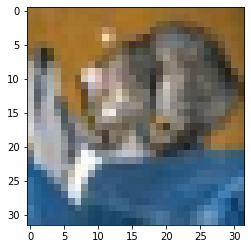

In [0]:
plt.imshow(X_test[0])

In [0]:
model = Sequential()

model.add(Conv2D(filters=32, kernel_size=(3,3), padding="same",activation="relu",input_shape=[32,32,3]))
model.add(Conv2D(filters=32, kernel_size=(3,3), padding="same",activation="relu"))
model.add(MaxPool2D(pool_size=(2,2),strides=2,padding="valid"))
model.add(Dropout(.5))
model.add(Flatten())
model.add(Dense(units=128,activation="relu"))
#SoftMax por que sigmoid e só para classificação binária
model.add(Dense(units=10,activation="softmax"))

#model.summary()

model.compile(loss="sparse_categorical_crossentropy",optimizer="adam",metrics=["sparse_categorical_accuracy"])

history = model.fit(X_train, y_train, batch_size=10, epochs=10, verbose=1, validation_data=(X_test,y_test))


Epoch 1/10
5000/5000 [==============================] - 212s 42ms/step - loss: 1.3764 - sparse_categorical_accuracy: 0.5084 - val_loss: 1.0777 - val_sparse_categorical_accuracy: 0.6168
Epoch 2/10
5000/5000 [==============================] - 212s 42ms/step - loss: 1.0671 - sparse_categorical_accuracy: 0.6220 - val_loss: 0.9932 - val_sparse_categorical_accuracy: 0.6452
Epoch 3/10
5000/5000 [==============================] - 213s 43ms/step - loss: 0.9523 - sparse_categorical_accuracy: 0.6635 - val_loss: 0.9474 - val_sparse_categorical_accuracy: 0.6668
Epoch 4/10
5000/5000 [==============================] - 211s 42ms/step - loss: 0.8698 - sparse_categorical_accuracy: 0.6925 - val_loss: 0.9174 - val_sparse_categorical_accuracy: 0.6792
Epoch 5/10
5000/5000 [==============================] - 215s 43ms/step - loss: 0.7995 - sparse_categorical_accuracy: 0.7158 - val_loss: 0.9292 - val_sparse_categorical_accuracy: 0.6800
Epoch 6/10
5000/5000 [==============================] - 218s 44ms/step - lo

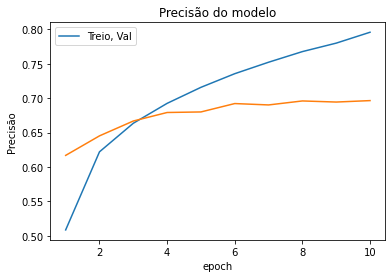

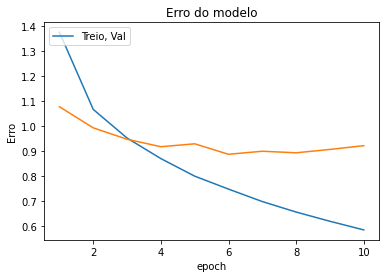

In [0]:
#Treino e Validação precisão
epochs = range(1, 11)
plt.plot(epochs, history.history['sparse_categorical_accuracy'])
plt.plot(epochs, history.history["val_sparse_categorical_accuracy"])
plt.title("Precisão do modelo")
plt.ylabel("Precisão")
plt.xlabel("epoch")
plt.legend(["Treio, Val"],loc='upper left')
plt.show()

#Treino e Validação erro
plt.plot(epochs, history.history['loss'])
plt.plot(epochs, history.history["val_loss"])
plt.title("Erro do modelo")
plt.ylabel("Erro")
plt.xlabel("epoch")
plt.legend(["Treio, Val"],loc='upper left')

plt.show()

In [0]:
!pip install mlxtend

     |████████████████████████████████| 1.3 MB 7.2 MB/s 
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.


In [0]:
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

In [0]:
y_pred = np.argmax(model.predict(X_test), axis=-1)

In [0]:
y_pred

Out[39]: array([3, 8, 8, ..., 5, 1, 7])

In [0]:
mat = confusion_matrix(y_test,y_pred)
print(mat)

[[744  20  27  12  17   8  19   9  91  53]
 [ 10 805   7   5   2   5   8   5  31 122]
 [ 77   8 486  63 111  89  82  39  28  17]
 [ 23  24  41 448  83 203  80  44  22  32]
 [ 23   7  36  73 683  29  70  56  14   9]
 [ 17  12  38 148  62 594  35  66  10  18]
 [  8   8  25  41  62  26 808   7  11   4]
 [ 17   6  24  24  73  43  11 760   9  33]
 [ 71  30  10   7   5   4   7   2 827  37]
 [ 26  78   5  13   8   7   7  11  35 810]]


Out[54]: (<Figure size 864x864 with 1 Axes>,
 <AxesSubplot:xlabel='predicted label', ylabel='true label'>)

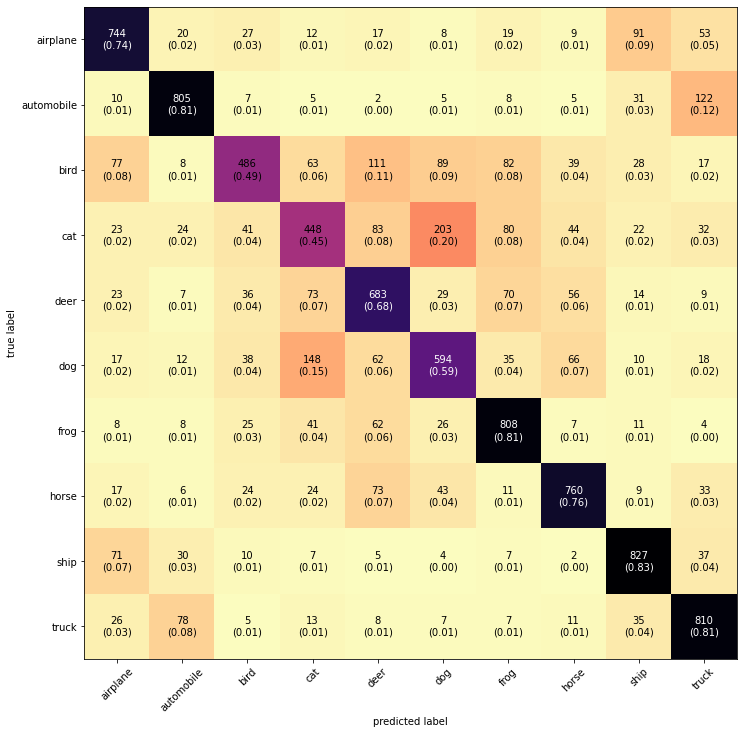

In [0]:
plot_confusion_matrix(mat,figsize=(12,12),class_names=classes_name,cmap="magma_r",show_normed=True)